# Spectral Clustering


In this exercise, you will implement spectral clustering and try it on diffent kinds of data, for instance:

* N-blob: Random points in $\mathbb{R}^2$ according to N Gaussian distributions with different means;

* Two moons: Random points shaped as two intertwined moons; 

* Point and circle: random points from a concentrated Gaussian point in the middle and a wide circle around it.

The first step after generating the data is to construct a graph and, for that, we need a similarity function. In this exercise we will use the following similarity:

$$
d(x_i, x_j) = \exp\left(-\frac{||x_i-x_j||_2^2}{2\sigma^2}\right)
$$

Using this similarity, we can compute the weight matrix W representing the graph, compute the graph Laplacian L and finally use its eigenvectors for clustering.


## Setup

In [1]:
from generate_data import worst_case_blob, blobs, two_moons, point_and_circle
from utils import plot_clusters, min_span_tree, plot_graph_matrix, min_span_tree
from utils import plot_clustering_result, plot_the_bend
from sklearn.cluster import KMeans
import sklearn.metrics as skm
import numpy as np
from skimage import io
import numpy as np
import matplotlib.pyplot as plt
import os


## Generating the data

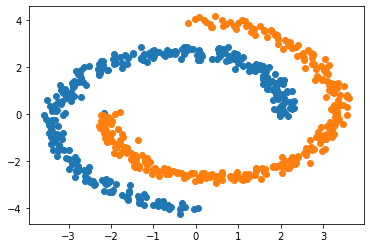

Signature: worst_case_blob(num_samples, delta=5)
Docstring:
Generates a single blob.

:param num_samples: number of samples to create in the blob
:param delta:
:return: X,  (num_samples, 2) matrix of 2-dimensional samples
         Y,  (num_samples, ) vector of "true" cluster assignment
File:      ~/Desktop/Graphs_ML/TP1_Clustering/spectral_clustering/generate_data.py
Type:      function


In [2]:
# Example

for fn in [two_moons]:  #  try also [worst_case_blob, point_and_circle, blobs]
    X, Y = fn(num_samples=600)
    plot_clusters(X, Y, fignum=str(fn))
    
# You can check the documentation of each function to see the optional parameters, e.g.:
worst_case_blob?

## Building similarity graph

In [3]:
from sklearn.metrics import pairwise_distances as pdist

def build_similarity_graph(X, var=1.0, eps=0.0, k=0):
    """
    TO BE COMPLETED.

    Computes the similarity matrix for a given dataset of samples. 
    If k=0, builds epsilon graph. 
    Otherwise, builds kNN graph.

    Parameters
    ----------
    X : numpy array
        (n x m) matrix of m-dimensional samples
    var : double 
        the sigma value for the exponential function, already squared
    eps : double
        threshold for epsilon graphs
    k : int
        The number of neighbours k for k-nn. If zero, use epsilon-graph

    Returns
    -------
        W: (n x n) dimensional matrix representing the weight matrix of the graph
    """
    n = X.shape[0]
    W = np.zeros((n, n))

    """
    Build similarity graph, before threshold or kNN
    similarities: (n x n) matrix with similarities between all possible couples of points.
    The similarity function is d(x,y)=exp(-||x-y||^2/(2*var))
    """
  
    #similarities = np.zeros((n, n))
    dist = pdist(X,metric="euclidean")
    sim = np.exp(-dist / (2*var))

    # If epsilon graph
    if k == 0:
        """
        compute an epsilon graph from the sim             
        for each node x_i, an epsilon graph has weights             
        w_ij = d(x_i,x_j) when w_ij >= eps, and 0 otherwise          
        """
        #print("Using epsilon similariy with eps =",eps)
        W = W + (sim >= eps) * sim

    # If kNN graph
    elif k != 0:
        """
        compute a k-nn graph from the similarities                   
        for each node x_i, a k-nn graph has weights                  
        w_ij = d(x_i,x_j) for the k closest nodes to x_i, and 0     
        for all the k-n remaining nodes                              
        Remember to remove self similarity and                       
        make the graph undirected                                    
        """
        tmp = -np.sort(-sim,axis=1) ### sort by disending order 
        nn = tmp[:,k-1].reshape((n,1)) ## take the distance of the k'th neighbour
        W = W + (sim >= nn) * sim
        #### Use the "OR" KNN to get symetric matrix 
        W = (W + W.T) / 2
        
    return W


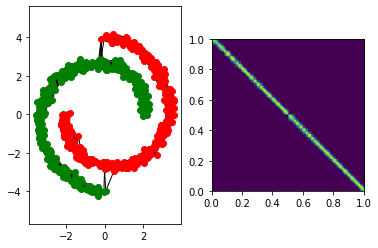

In [4]:
# Example²
W = build_similarity_graph(X,k=20)
plot_graph_matrix(X, Y, W)  # shows the graph and the visualization of W



## Computing the Laplacian

In [70]:
from scipy import sparse
from numpy.linalg import inv
def build_laplacian(W, laplacian_normalization='unn'):
    """
    Compute graph Laplacian.

    Parameters
    ----------
    W : numpy array
        Adjacency matrix (n x n)
    laplacian_normalization : str
        String selecting which version of the laplacian matrix to construct.
            'unn':  unnormalized,
            'sym': symmetric normalization
            'rw':  random-walk normalization   

    Returns
    -------
    L: (n x n) dimensional matrix representing the Laplacian of the graph
    """
    
    n = W.shape[0]
    L = np.zeros((n, n))
    D = np.diag(W @ np.ones(n))

    if laplacian_normalization == 'unn':
        L = D - W
    elif laplacian_normalization == 'sym':
        L = np.eye(n) - np.power(inv(D),0.5) @ W @ np.power(inv(D),0.5)
    elif laplacian_normalization == 'rw':
        L = np.eye(n) - inv(D) @ W

    return L


    

## Clustering

In [23]:
from sklearn.cluster import KMeans
import scipy

def select_eigvals(eigvals):
    ### relative difference (lamda_i+1-lamda_i)/lamda_i
    ### ignore the first eigenvector
    diff  = (eigvals[2:]-eigvals[1:-1])/eigvals[1:-1]
    k = np.argmax(diff)
    return np.array(range(1,k+2)) 

def spectral_clustering(L,chosen_eig_indices=None,num_classes=None,return_eigvecs=False):
    """
    Parameters
    ----------
    L : numpy array
        Graph Laplacian (standard or normalized)
    choosen_eig_indices : list or None
        Indices of eigenvectors to use for clustering. 
        If None, use adaptive choice of eigenvectors.
    num_classes : int 
        Number of clusters to compute (defaults to 2)


    Returns
    -------
    Y : numpy array (num_samples, )
        Cluster assignments
    """

    """
    Use the function scipy.linalg.eig or the function scipy.sparse.linalg.eigs to compute:
    U = (n x n) eigenvector matrix           (sorted)
    E = (n x n) eigenvalue diagonal matrix   (sorted)
    """
    eigenvals,eigenvecs = scipy.linalg.eig(L)
    
    eigenvecs = eigenvecs.real

    idx = np.argsort(eigenvals)
    eigenvals = eigenvals[idx].real
    eigenvecs = eigenvecs[:,idx].real ### sort eigvenvectors by eigenvalue


    """
    compute the clustering assignment from the eigenvectors        
    Y = (n x 1) cluster assignments in [0,1,...,num_classes-1]                   
    """
    
    
     
    if not chosen_eig_indices:
        chosen_eig_indices =select_eigvals(eigenvals)
        num_classes = chosen_eig_indices.shape[0]+1 
    
    
    km = KMeans(n_clusters=num_classes)
    Y = km.fit_predict(eigenvecs[:,chosen_eig_indices])

    if return_eigvecs:
        return Y,eigenvecs[:,chosen_eig_indices]
    return Y

## Parameter sensitivity 

In [12]:
def log_uniform(min,max,n):
    mn = np.log(min)
    mx = np.log(max)
    lg_intv = np.linspace(mn,mx,n)
    return np.exp(lg_intv)

def parameter_sensitivity():
    """
    TO BE COMPLETED.

    A function to test spectral clustering sensitivity to parameter choice.
    """
    # the number of samples to generate
    num_samples = 500

    """
    Choose parameters
    """
    var = 1.0  # exponential_euclidean's sigma^2
    laplacian_normalization = 'rw'
    chosen_eig_indices = None

    """
    Choose candidate parameters
    """
    #ks =  np.round(log_uniform(5,400,50)).astype(int) ## candidate KNN numbers
    ks = np.round(np.linspace(5,500,50)).astype(int)
    es = log_uniform(1e-4,1,50) ## candidate epsilons

    params = {"k":ks,"eps":es}


    for p_name in params:
        print("parameter"+p_name)

        parameter_performance = []

        for x in params[p_name]:
            
            X, Y = two_moons(num_samples, 1, 0.02)
            num_classes = len(np.unique(Y))

            args = {p_name:x}
            W = build_similarity_graph(X,**args)
            L = build_laplacian(W, laplacian_normalization)
            Y_rec = spectral_clustering(L, chosen_eig_indices, num_classes)
            parameter_performance += [skm.adjusted_rand_score(Y, Y_rec)]

        fig, ax = plt.subplots(constrained_layout=True)
        ax.set_xlabel(p_name)
        ax.set_ylabel('Random index')
        ax.plot(params[p_name], parameter_performance)  
        
    plt.show()

## Image segmentation

In [13]:
def image_segmentation(input_img='four_elements.bmp'):
    """
    TO BE COMPLETED

    Function to perform image segmentation.

    :param input_img: name of the image file in /data (e.g. 'four_elements.bmp' or 'fruit_salad.bmp')
    """
    filename = os.path.join('data', input_img)

    X = io.imread(filename)
    X = (X - np.min(X)) / (np.max(X) - np.min(X))

    im_side = np.size(X, 1)
    Xr = X.reshape(im_side ** 2, 3)
    """
    Y_rec should contain an index from 0 to c-1 where c is the     
     number of segments you want to split the image into          
    """

    """
    Choose parameters
    """
    var = 1.0
    k = 20
    laplacian_normalization = 'unn'

    ### We have 5 clusters, 4 balloons and the background ==> take 4 eigenvectors.
    chosen_eig_indices = [2,3,4,5]

    num_classes = 5
    W = build_similarity_graph(Xr, var=var, k=k)
    L = build_laplacian(W, laplacian_normalization)
    Y_rec = spectral_clustering(L, chosen_eig_indices, num_classes=num_classes)
    
    plt.figure()

    plt.subplot(1, 2, 1)
    plt.imshow(X)

    plt.subplot(1, 2, 2)
    Y_rec = Y_rec.reshape(im_side, im_side)
    plt.imshow(Y_rec)

    plt.show()

In [67]:

def max_eps_graph(X):
    ### Build full graph
    W_full = build_similarity_graph(X,eps=0)
    ### Take only the edges of the minimum spanning tree
    ### Take maximum edge length.
    best_eps = np.max(min_span_tree(W_full)*W_full)
    W_e = build_similarity_graph(X,eps=best_eps)
    return W_e

using knn similary with k 20
Chosen eigenvalues: [0.02048387 0.05079215 0.07270338 0.09253892]


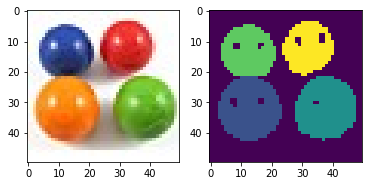

In [10]:
image_segmentation()

# Questions

### Q1: Is it important to build a connected graph? Compare k-NN to $\epsilon$-graphs with respect to the difficulty of building a connected graph. 

When working with spectral clustering algorithm, it is not necessary for the graph representing the data to be connected, but each cluster has to be connected.

This is because if the graph has N separate connected components then it's adjacency matrix A is equivalent to a block diagonal matrix with N components. The spectrum of this matrix will be the union of the spectrum of each of it's blocks. Plus, and the eigenvectors of each block will span only the subspace of the block and thus they do not convey information about the graph as a whole.

To illustrate our discussion, let's take the two moons dataset consisting of clusters $Moon_1$ and $Moon_2$, we are looking for two clusters.

Let's consider two cases of the affinity matrix:

* If the two clusters are not connected but each cluster in itself is connected. Then we get a 2 block diagonal matrix. Each block will have a trivial eigenvector for the 0 eigenvalue. This vector can be though of as the indicator of the subspace. Using eather of the indicator vectors of the two clusters we can threshold and find our clustering.

* If the two moons are not connected and one moon is further broken down to two connected components. We get a 3 block affinity matrix. Each block with it's indicator eigenvector. Since each block's eigenvector spans a different subspace there's no eigenvector that spans the whole moon subset which we can use to link it's two parts. The broken moon subset will be attributed randomly to either cluster.




######################################

When it comes to having a (non fully connected) connected graph from our data, K-nn seems to be the better choice.

$\epsilon$ graph distance based matching tends create connected components in the same compact region. We need to chose epsilon low enough to allow for connections between far away regions.
 
This can cause an issue when the inter component region varies much from a region to another. 

 If one component is too far away from the others we need to set a low epsilon and risk having a "too many" connections between relatively far components. Thus lose the local information of our graph. This is especially the problem when inter-component distance can vary by much as we will have to connected more and more points.

On the other hand one can more easily create a connected graph using k-nn if provided with a rough estimate of the number of points in each cluster $p_c$. If we choose $k = max_c \, p_c +1 $  then we get a connected graph with few intern cluster edges. Thus allowing to preserve local information.

We illustrate this difference in the plot below, we see that KNN is able to give better clustering results compared to the maximum possible epsilon. This is because we have fewer edges connecting different components and thus local information is better preserved.



____________EPS___________


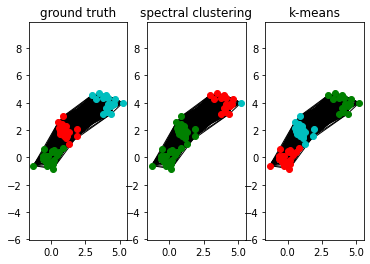

In [63]:
from sklearn.datasets import make_blobs
X,Y= make_blobs(n_samples=60,centers=[[0,0],[1,2],[4,4]],cluster_std=0.5)
print("____________EPS___________")
W_e = max_eps_graph(X)
L_e = build_laplacian(W_e,laplacian_normalization='unn')
Y_e = spectral_clustering(L_e, chosen_eig_indices=[1,2], num_classes=3)
plot_clustering_result(X, Y, W_e, Y_e, KMeans(3).fit_predict(X))

____________KNN___________


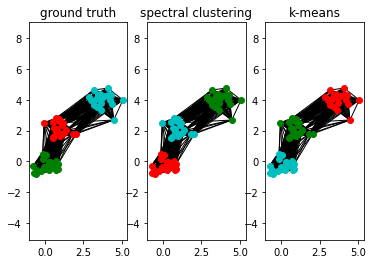

In [19]:
print("____________KNN___________")
W_k = build_similarity_graph(X,k=25,eps=0.5)
L_k = build_laplacian(W_k,laplacian_normalization='unn')
Y_k = spectral_clustering(L_k, chosen_eig_indices=[1,2], num_classes=3)
plot_clustering_result(X, Y, W_k, Y_k, KMeans(3).fit_predict(X))

### Q2: The function `min_span_tree` can be used to choose the value of $\epsilon$ that keeps the graph connected. Using the `worst_case_blob`, can you tell when it is a bad idea to use this approach?

$\epsilon$ similarity may not be the best choice in certain situations. In (1) we discussed the case when the inter cluster distance varies by a lot. Worst_case blob is another case where there's a single outlier outside of the appearing compact cluster. This outlier forces us to choose a high value for $\epsilon$ to keep the graph connected and in result we have a significantly more connected graph. We get a dense adjacency matrix with the computational burden it bears and loose a lot of the local information. 

The intuition is that a fully connected graph bears no information at all. And the closer we get to this case the harder it is to perform clustering.

From the  plots below,we see that the $\epsilon_{max}$ decreases with the distance of the outlier. And thus fewer edges are being eliminated with thresholding. Notice that we get a relatively sparse matrix when there's no outlier and a dense matrix when the distance to the outlier exceeds the "diameter" of the cluster.

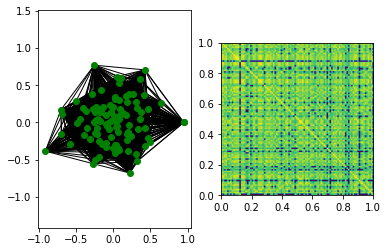

In [64]:
X,Y= worst_case_blob(num_samples=100,delta=0)
W_e = max_eps_graph(X)
plot_graph_matrix(X,Y,W_e)

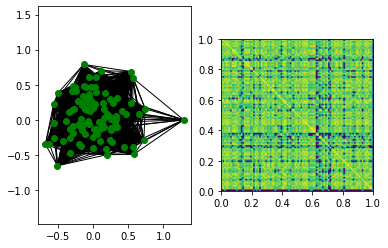

In [65]:
X,Y= worst_case_blob(num_samples=100,delta=0.5)
W_e = max_eps_graph(X)
plot_graph_matrix(X,Y,W_e)

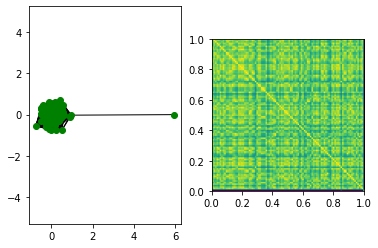

In [66]:
X,Y= worst_case_blob(num_samples=100,delta=5)
W_e = max_eps_graph(X)
plot_graph_matrix(X,Y,W_e)

### Q3: Build a graph starting from the data generated in `blobs`, and keep the graph connected. Motivate your choice on which eigenvectors to use and how you computed the clustering assignments from the eigenvectors. Now compute a similar clustering using the built-in k-means and compare the results.

In the course, we discussed a bipartile cuts. As in when we have to separate the data to two distinct clusters respecting a certain criterion. There exists various ways to take into account more clusters, like  "recursive bipartitioning". For this work we choose to work with the K-way clustering, where the cut objective function itself is modified to take into account more clusters. For $k$ clusters one that the original optimization problem can be solved by thresholding over the eigenvectors [1,..,k-1]. And that the relaxed version of this problem requires clustering using the same eigenvectors (we start from 0). 

The same reason for ignoring the first eigenvector holds as all of the lines of the adjacency matrix sum to 0, making the constant vector a trivial minimum. 

References :

1 A tutorial on spectral clustering : https://arxiv.org/abs/0711.0189



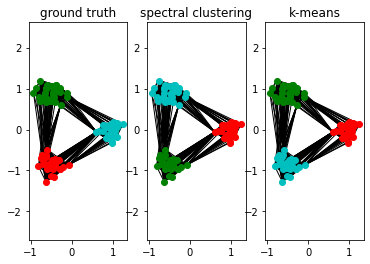

In [21]:
X, Y = blobs(num_samples=100,n_blobs=3)
W_b = build_similarity_graph(X,k=35)
L_b = build_laplacian(W_b,laplacian_normalization='unn')
Y_b = spectral_clustering(L_b, chosen_eig_indices=[1,2], num_classes=3)
plot_clustering_result(X, Y, W_b, Y_b, KMeans(3).fit_predict(X))


### Q4: In the function spectral_clustering, implement an automatic strategy to choose the eigenvectors to use for clustering, when chosen_eig_indices=None. Explain your strategy. Generate a dataset with 4 blobs and test your function. What happens when the variance of the blobs increase?

As discussued in (3), when looking for $k$ clusters one has to use the eigenvectors [1,..,k-1]. But this supposes we know how many clusters we are looking for.

From ref [1], we understand that for a complex domain with a bottleneck (eg : two distinct weakly connected clusters), the adjacency matrix $A_b$ can be seen as a noisy version of the strictly block diagonal matrix $A_d$ representing the disconnected distinct domains. From such conclusion arises the remark that the eigenvectors of $A_b$ can be seen as noisy estimates of those of $A_d$.

With this in mind we get that each  strongly connected region we get a trivial constant eigenvector (padded with zeros) for the 0 eigenvalue.

Now, since we deal with a noisy version each region will have an almost constant vector with high entries for the region and almost zero for the other for eigenvalue which will be close to zero. This can be thought of as an indicator function of the subspace.

This intuition  can explain the choice of the first [1,..,k-1] eigenvalues in the k-way clustering as we will be looking for a noisy indicator eigenvector of each region.

With this explanation in mind, we define the number of clusters as the number of eigenvectors with an eigenvalue near zero. 

In practice these eigenvectors take small values. And to distinguish them we look for a sudden jump in the slope incurred by the laplacian eigenvectors.

The jump point is defind as $k= argmax \frac{\lambda_{i+1}-\lambda_i}{\lambda_i}$.


References :

**[1] A tutorial on spectral clustering  ** : https://arxiv.org/abs/0711.0189



k = 2


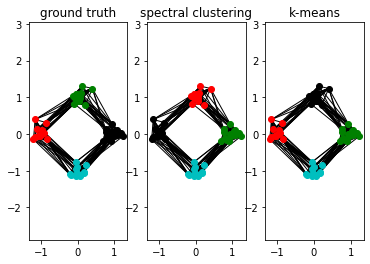

In [22]:
X, Y = blobs(num_samples=50, n_blobs=4, blob_var=0.15)
W_b = build_similarity_graph(X,k=15)
L_b = build_laplacian(W_b,laplacian_normalization='unn')
Y_b = spectral_clustering(L_b)
plot_clustering_result(X, Y, W_b, Y_b, KMeans(4).fit_predict(X))

### Q5: When you built the cluster assignment, did you use thresholding, k-means or both? Do you have any opinion on when to use each?

For our implementation we use k-means over the selected eigen vectors in order to cluster the nodes.

Thresholding works better when using the "unnormalized" or the "random walk" laplacians who's eigen vectors are the approximate indicator functions of the connected components.

This works less for $L_{sym}$ because it's eigenvectors are additionally multiplied by $D^{\frac{1}{2}}$.


In the plots below we show the entries of the eigenvectors used for classificaiton for both the symetric and random walk laplacians. 

We see that the entries for the symmetric laplacian are more dispersed compared to the random walk because they are multiplied by each node's degree.

eigvecs shape (1, 100)


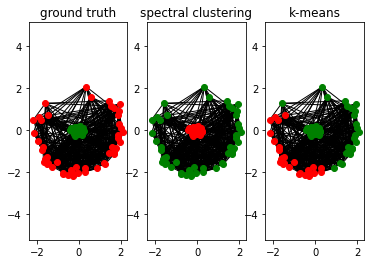

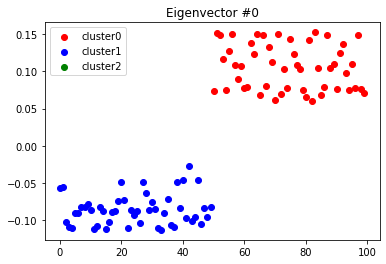

In [68]:
# Example
num_samples = 100
X, Y = point_and_circle(num_samples=num_samples)
##" Build grad using maximum epsilon
W_e = max_eps_graph(X)
L = build_laplacian(W,laplacian_normalization='sym')
Y_rec,eigvecs = spectral_clustering(L,chosen_eig_indices=[1],num_classes=2,return_eigvecs=True)

################# Plot eigenvector entries #################
cdict = {0: 'red', 1: 'blue',2:'green'}
scatter_x = np.array(range(num_samples))
eigvecs = eigvecs.T ## shape [n_vecs,n_nodes]
print("eigvecs shape",eigvecs.shape)
labels = Y_rec

plot_clustering_result(X, Y, W, Y_rec, KMeans(2).fit_predict(X))

for i,vector in enumerate(eigvecs):
    fig, ax = plt.subplots()

    for label,color in zip(cdict.keys(),cdict.values()):
        
        idx = np.where(labels==label)
        ax.scatter(scatter_x[idx],vector[idx],c=cdict[label],label='cluster'+str(label))

    ax.set_title("Eigenvector #"+str(i))
    ax.legend()
    plt.show()



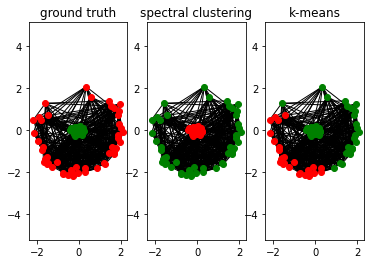

eigvecs shape (1, 100)


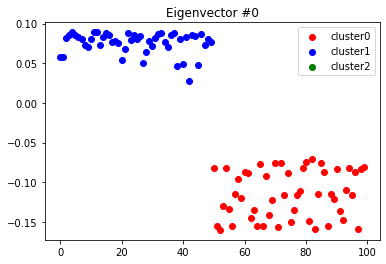

In [69]:
L = build_laplacian(W,laplacian_normalization='rw')
Y_rec,eigvecs = spectral_clustering(L,chosen_eig_indices=[1],num_classes=2,return_eigvecs=True)

plot_clustering_result(X, Y, W, Y_rec, KMeans(2).fit_predict(X))

################# Plot eigenvector entries #################
cdict = {0: 'red', 1: 'blue',2:'green'}
scatter_x = np.array(range(num_samples))
eigvecs = eigvecs.T ## shape [n_vecs,n_nodes]
print("eigvecs shape",eigvecs.shape)
labels = Y_rec

for i,vector in enumerate(eigvecs):
    fig, ax = plt.subplots()

    for label,color in zip(cdict.keys(),cdict.values()):
        
        idx = np.where(labels==label)
        ax.scatter(scatter_x[idx],vector[idx],c=cdict[label],label='cluster'+str(label))

    ax.set_title("Eigenvector #"+str(i))
    ax.legend()
    plt.show()

### Q6: Generate `two_moons` data and compare spectral clustering to k-means. Do you notice any difference? Taking into consideration the graph structure, can you explain them?

While spectral clustering manages perfectly match the clusters, k-means seems to struggle to find a partinioning.

This is because k-means cares about the relative distance of points within a cluster, it focuses on finding compact partionings.

Whereas spectral clustering is looking for connectivity within a cluster, allowing for non convex partionings.

using knn similary with k 20
relative diff [1.82845378 0.32580941 0.87962768 0.04932375]
argmax diff = 0
chosen eig indices [1]


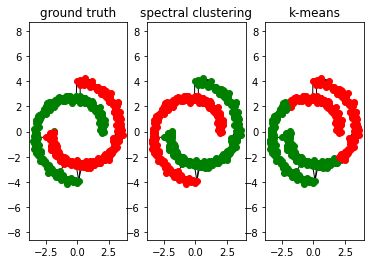

In [87]:
X, Y = two_moons(num_samples=600)
W = build_similarity_graph(X,k=20)
L = build_laplacian(W,laplacian_normalization='unn')
Y_rec = spectral_clustering(L)
# Plot results, comparing to KMeans
plot_clustering_result(X, Y, W, Y_rec, KMeans(num_classes).fit_predict(X))


### Q7: Generate `point_and_circle` data and compare spectral clustering using the normal Laplacian and the random-walk regularized Laplacian. Do you notice any difference? Taking into consideration the graph structure, can you explain them?

Spectral clustering with the unnormalized laplacian solves the RatioCut problem. Whereas the random walk laplacian solves the NCut problem.

In RatioCut we look to minimize the links between clusters while keeping them of roughly the same size.Thus we minimize the between-cluster similarity.

Whereas in NCut we look to minimize the links between clusters while keeping them of roughly the same volume. This objective favours both minimize the between-cluster similarity and maximizing the intra-cluster similarity.

Favouring intra-cluster similarity is equivalent to encouraging compact clustering. Which is why the random walk laplacian does a better job finding the central, compact cluster.








using knn similary with k 55


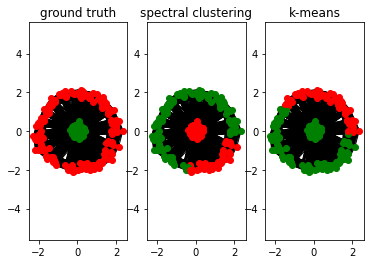

In [37]:
X, Y = point_and_circle(num_samples=300)
W_pc = build_similarity_graph(X,k=55)
L_pc = build_laplacian(W_pc,laplacian_normalization='unn')
Y_pc = spectral_clustering(L_pc, chosen_eig_indices=[1], num_classes=2)
plot_clustering_result(X, Y, W_pc, Y_pc, KMeans(2).fit_predict(X))



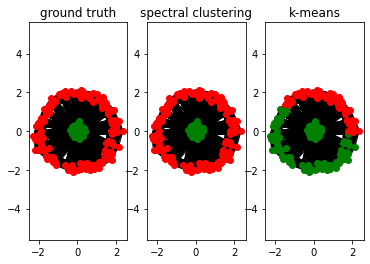

In [38]:
L_pc = build_laplacian(W_pc,laplacian_normalization='rw')
Y_pc = spectral_clustering(L_pc, chosen_eig_indices=[1], num_classes=2)
plot_clustering_result(X, Y, W_pc, Y_pc, KMeans(2).fit_predict(X))


### Q8: Using the function parameter_sensitivity, comment on the stability of spectral clustering when varying $\epsilon$ or k. 

In the plots below we report on the evolution of the evolution of the random score index as a function of the parameters k, and epsilon used to construct the adjacency matrix.

We see that for each parameter there exists an interval which yields satisfactory results. 

For k this interval seems to lay between [20,50] whereas for epsilon between [0.65,0.9].

 Using $\epsilon$ for constructing the graph seems safer it has a higher chance of yielding good results.

parameterk
parametereps


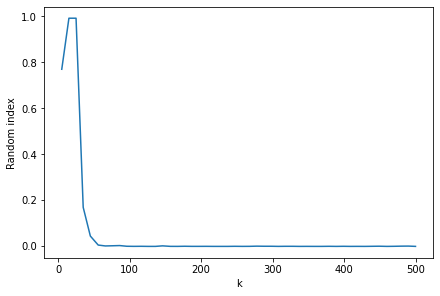

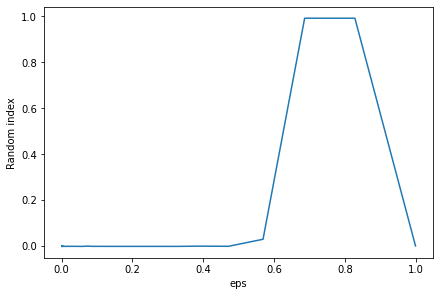

In [29]:
parameter_sensitivity()

### Q9: If we did not have access to "true" labels, how could we evaluate the clustering result (or what should we not use as evaluation)?

Various metrics exist to evaluate a clustering result,including "Conductance","Silhouette index" and the most popular is the "Modularity".
Modularity, states that a good cluster should have a bigger than expected number of internal edges and a smaller than expected number of inter-cluster edges when compared to a random graph with similar characteristics.

Usually such metrics favour both intra cluster similarity and inter cluster dissimilarity. One should always look for metrics that favour both.

One example of a metric one shouldn't use is the the sum of squared distance (SSE) between data points and their assigned clusters’ centroids (usually used for k-means), because this metric favours only intra cluster similarity.




** References ** : [4] Is there a best quality metric for graph clusters? : https://www.researchgate.net/publication/220699248_Is_There_a_Best_Quality_Metric_for_Graph_Clusters

### Q10: A full graph built between the pixels of a 50 × 50 image corresponds to $50^2$ nodes. Solving the full eigenvalue problem in this case would scale in the order of $2^{34}$ . Even on weak hardware this takes only seconds to minutes. Segmenting a Full HD picture of 1920 × 1080 would scale in the order of $2^{64}$ (about a month on a decent machine). Beyond that, the large picture would require to store in memory a graph over millions of nodes. A full graph on that scale requires about 1TB of memory. Can you think two simple techniques to reduce the computational and occupational cost of Spectral Clustering?

The main bottleneck of spectral clustering comes from the eigen decomposition of the affinity matrix $A$ which is of $O(n^3)$

Most of the ideas to solve this issue revolve around reducing this matrix dimensions.

In the case of images the easiest and most intuitive way would be to downsample the image, perform spectral clustering and then project the obtained subgraphs back into the original image.

One similar idea (ref [2]), would be to perform k-means on the original image to down sample it to a fixed number of representative points $n_k$ (the centers of the centroids). And just like previously perform spectral clustering and project back to the original image.

Another line of thought would be to use low rank approximations of $A$ to compute the eigenvectors. In reference 3, they randomly sample points from $A$ and use the Nystrom approximation to compute an estimate of the eigenvectors of the full matrix.


References :

** [2] Fast Approximate Spectral Clustering**  :https://www.researchgate.net/publication/221654200_Fast_Approximate_Spectral_Clustering

** [3] Spectral Grouping Using the Nystrom Method**: https://www.researchgate.net/publication/8337767_Spectral_Grouping_Using_the_Nystrm_Method